In [2]:
import pandas as pd
import numpy as np
import glob
import matplotlib.pylab as plt
import seaborn as sns

In [3]:
df = pd.read_csv('./Data/BS_train.csv')
df.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
2,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
3,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
4,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1


In [8]:
df.ever_married.value_counts()

ever_married
Yes    3280
No     1701
Name: count, dtype: int64

In [10]:
df['gender'] = np.where(df['gender']=='Male',1,0)
df['ever_married'] = np.where(df['ever_married']=='Yes',1,0)

In [13]:
cols = df.select_dtypes('object').columns
cols
df = pd.get_dummies(df, columns=cols, drop_first=True)

In [15]:
from sklearn.model_selection import train_test_split
X = df.drop('stroke', axis=1)
y = df.stroke

X_train, X_valid, y_train, y_valid = train_test_split(X,y , test_size=0.2, random_state=42, stratify=y)

print(X_train, X_valid, y_train, y_valid)
print(X_train.shape, X_valid.shape, y_train.shape, y_valid.shape)

      gender   age  hypertension  heart_disease  ever_married  \
4428       0  24.0             0              0             0   
1135       1   3.0             0              0             0   
2417       0  69.0             0              0             1   
1173       0  46.0             0              0             1   
3696       1  52.0             1              0             1   
...      ...   ...           ...            ...           ...   
4049       0  29.0             0              0             0   
1053       1  56.0             0              0             1   
3526       0  53.0             0              0             1   
3051       0  44.0             0              0             1   
2029       1  45.0             1              0             1   

      avg_glucose_level   bmi  work_type_Private  work_type_Self-employed  \
4428             187.99  24.9               True                    False   
1135              86.38  22.8              False                 

In [16]:
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [19]:
lgr = LogisticRegression()
lgr.fit(X_train, y_train)
lgr.score(X_valid, y_valid)

c:\Users\Administrator\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.9498495486459378

In [20]:
sgdc = SGDClassifier()
sgdc.fit(X_train, y_train)
sgdc.score(X_valid, y_valid)

0.7793380140421263

In [21]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)
dtc.score(X_valid, y_valid)

0.9097291875626881

In [41]:
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
rfc.score(X_valid, y_valid)



0.9488465396188566

In [24]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Embedding, LSTM, Bidirectional, Flatten
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [33]:
model = Sequential()
model.add(Dense(32,input_shape=(X_train.shape[1],), activation='relu' ))
model.add(Dense(16,activation='relu' ))
model.add(Dropout(0.4))
model.add(Dense(2,activation='softmax' ))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

es = EarlyStopping(patience=5, restore_best_weights=True )
mc = ModelCheckpoint('best_model0903.keras', save_best_only=True)

histroy = model.fit (X_train, y_train, epochs =10,
                     validation_data=(X_valid, y_valid),
                     callbacks=[es, mc])

Epoch 1/10


c:\Users\Administrator\AppData\Local\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.8711 - loss: 1.6831 - val_accuracy: 0.9498 - val_loss: 0.2458
Epoch 2/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9287 - loss: 0.2950 - val_accuracy: 0.9498 - val_loss: 0.2153
Epoch 3/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9440 - loss: 0.2653 - val_accuracy: 0.9498 - val_loss: 0.1942
Epoch 4/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9480 - loss: 0.2336 - val_accuracy: 0.9498 - val_loss: 0.1851
Epoch 5/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9462 - loss: 0.2294 - val_accuracy: 0.9498 - val_loss: 0.1808
Epoch 6/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9473 - loss: 0.2160 - val_accuracy: 0.9498 - val_loss: 0.1793
Epoch 7/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9509 - loss: 0.2076 - val_accuracy: 0.9498 - val_loss: 0.1748
Epoch 8/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9520 - loss: 0.1947 - val_accuracy: 0.9498 - val_

In [34]:
df5 = pd.read_csv('./Data/BS_valid.csv')
df5.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,31.555602,never smoked,1
1,Female,59.0,0,0,Yes,Private,Rural,76.15,30.242937,Unknown,1
2,Male,78.0,0,1,Yes,Private,Urban,219.84,30.698951,Unknown,1
3,Male,57.0,0,1,No,Govt_job,Urban,217.08,33.808410,Unknown,1
4,Male,58.0,0,0,Yes,Private,Rural,189.84,31.378534,Unknown,1


In [35]:
df5['gender'] = np.where(df5['gender']=='Male',1,0)
df5['ever_married'] = np.where(df5['ever_married']=='Yes',1,0)

In [36]:
df5.isna().sum()

gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

In [37]:
# Tabular Test 데이터 전처리 - 원 핫 인코딩
obj_col2 = df5.select_dtypes('object').columns
df5 = pd.get_dummies(data=df5, columns=obj_col2, drop_first=True)

In [39]:
# Tabular Test 데이터 feature, label 분류
x_test = df5.drop('stroke', axis=1)
y_test = df5['stroke']

In [42]:
# Tabular Test 데이터로 머신러닝, 딥러닝 모델 성능 예측
lgr_y_pred = lgr.predict(x_test)
sgdc_y_pred = sgdc.predict(x_test)
dtc_y_pred = dtc.predict(x_test)
rfc_y_pred = rfc.predict(x_test)
model_y_pred = model.predict(x_test)
model_y_pred = np.argmax(model_y_pred, axis=1)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


In [44]:
from sklearn.metrics import classification_report, confusion_matrix


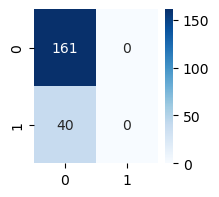

In [47]:
# Logistic Regression 모델 성능 - 모델이 다 0을 예측해서 좋은거처럼 보였던거 같네요
plt.figure(figsize=(2,2))
cm = confusion_matrix(y_test, lgr_y_pred)
sns.heatmap(data=cm, annot=True, fmt='d', cmap='Blues')
plt.show()

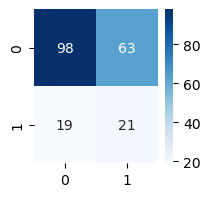

In [49]:
# SGDC Classifier 모델 성능 - 훈련이 잘못된거 같아요.
plt.figure(figsize=(2,2))
cm = confusion_matrix(y_test, sgdc_y_pred)
sns.heatmap(data=cm, annot=True, fmt='d', cmap='Blues')
plt.show()

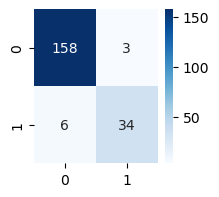

In [50]:
# DecisionTreeClassifier 모델 성능 - 오 분류 성능이 꽤 좋아보입니다.
plt.figure(figsize=(2,2))
cm = confusion_matrix(y_test, dtc_y_pred)
sns.heatmap(data=cm, annot=True, fmt='d', cmap='Blues')
plt.show()

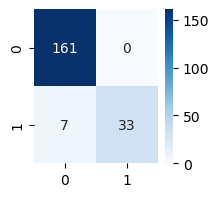

In [51]:
# RandomForestClassifier 모델 성능 - 오 분류 성능이 꽤 좋아보입니다. DecisionTree와 비슷한 성능인거 같네요.
plt.figure(figsize=(2,2))
cm = confusion_matrix(y_test, rfc_y_pred)
sns.heatmap(data=cm, annot=True, fmt='d', cmap='Blues')
plt.show()

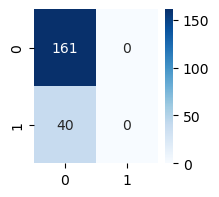

In [52]:
# 딥러닝 모델 성능 - 모델이 다 0을 예측해서 좋은거처럼 보였던거 같네요
plt.figure(figsize=(2,2))
cm = confusion_matrix(y_test, model_y_pred)
sns.heatmap(data=cm, annot=True, fmt='d', cmap='Blues')
plt.show()

In [53]:
# 모델중에 가장 성능이 좋아보이는 DecisionTreeClassifier의 예측값을 테스트 데이터셋 csv에 추가
# df5['pred'] = rfc_y_pred
df5['pred'] = dtc_y_pred
df5

,gender,age,hypertension,heart_disease,ever_married,avg_glucose_level,bmi,stroke,work_type_Private,work_type_Self-employed,work_type_children,Residence_type_Urban,smoking_status_formerly smoked,smoking_status_never smoked,smoking_status_smokes,pred
0,0,61.0,0,0,1,202.21,31.555602,1,False,True,False,False,False,True,False,0
1,0,59.0,0,0,1,76.15,30.242937,1,True,False,False,False,False,False,False,1
2,1,78.0,0,1,1,219.84,30.698951,1,True,False,False,True,False,False,False,1
3,1,57.0,0,1,0,217.08,33.808410,1,False,False,False,True,False,False,False,0
4,1,58.0,0,0,1,189.84,31.378534,1,True,False,False,False,False,False,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,1,41.0,0,0,0,70.15,29.756631,0,True,False,False,False,True,False,False,0
197,1,40.0,0,0,1,191.15,31.124172,0,True,False,False,True,False,False,True,0
198,0,45.0,1,0,1,95.02,31.798304,0,False,False,False,False,False,False,True,0
199,1,40.0,0,0,1,83.94,29.951301,0,True,False,False,False,False,False,True,0


In [ ]:
# 테스트 데이터셋 모델 성능 확인 - 안해도 되는 작업이지만 라벨이 있어서 한번 더 확인해봤습니다.
correct_count = sum(df5['stroke']==df5['pred'])
total_count = len(df5)
model_accuracy = correct_count/total_count
print(f'model_accuracy : {model_accuracy:.2f}')

In [56]:
correct_count = sum(df5['stroke']==df5['pred'])
total_count = len(df5)
model_accuracy = correct_count/total_count
print(f"Model_accuracy:{model_accuracy:.2f}")

Model_accuracy:0.96


In [57]:
# Tabular 머신러닝 모델 저장을 위한 joblib 라이브러리 임포트
import joblib
joblib.dump(dtc, '01026469563_1.joblib')# Tabular 데이터는 '연락처_1.joblib' 으로 저장

['01026469563_1.joblib']

In [60]:
# Tabular 모델 저장 확인
tab_load_model = joblib.load('01026469563_1.joblib')

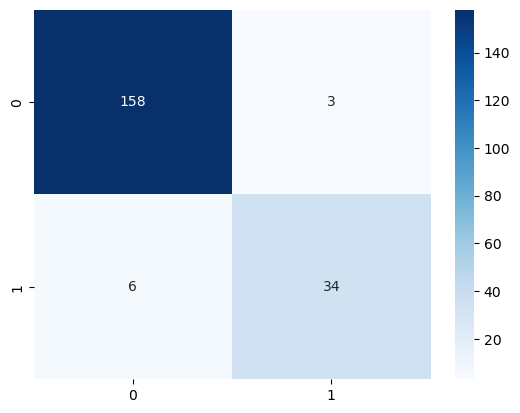

In [61]:
# Tabular 모델 불러와서 모델 성능 확인 / 시험에서는 불필요
tab_load_y_pred = tab_load_model.predict(x_test)
cm = confusion_matrix(y_test, tab_load_y_pred)
sns.heatmap(data=cm, annot=True, fmt='d', cmap='Blues')
plt.show()

In [63]:
df5.to_csv('01026469563_1.csv', index=False, encoding='utf-8')

In [65]:
df6= pd.read_csv('01026469563_1.csv')
df6.head()

,gender,age,hypertension,heart_disease,ever_married,avg_glucose_level,bmi,stroke,work_type_Private,work_type_Self-employed,work_type_children,Residence_type_Urban,smoking_status_formerly smoked,smoking_status_never smoked,smoking_status_smokes,pred
0,0,61.0,0,0,1,202.21,31.555602,1,False,True,False,False,False,True,False,0
1,0,59.0,0,0,1,76.15,30.242937,1,True,False,False,False,False,False,False,1
2,1,78.0,0,1,1,219.84,30.698951,1,True,False,False,True,False,False,False,1
3,1,57.0,0,1,0,217.08,33.808410,1,False,False,False,True,False,False,False,0
4,1,58.0,0,0,1,189.84,31.378534,1,True,False,False,False,False,False,False,1


In [66]:
# Text 분류 모델 만들기

In [140]:
tdf = pd.read_csv("./Data/t_train.csv", header=None)
tdf.head()

,0,1,2,3
0,2401,Borderlands,Positive,im getting on borderlands and i will murder yo...
1,2401,Borderlands,Positive,I am coming to the borders and I will kill you...
2,2401,Borderlands,Positive,im getting on borderlands and i will kill you ...
3,2401,Borderlands,Positive,im coming on borderlands and i will murder you...
4,2401,Borderlands,Positive,im getting on borderlands 2 and i will murder ...


In [141]:
tdf.tail()

,0,1,2,3
74677,9200,Nvidia,Positive,Just realized that the Windows partition of my...
74678,9200,Nvidia,Positive,Just realized that my Mac window partition is ...
74679,9200,Nvidia,Positive,Just realized the windows partition of my Mac ...
74680,9200,Nvidia,Positive,Just realized between the windows partition of...
74681,9200,Nvidia,Positive,Just like the windows partition of my Mac is l...


In [149]:

tdf.head()

,label,feature
0,Positive,im getting on borderlands and i will murder yo...
1,Positive,I am coming to the borders and I will kill you...
2,Positive,im getting on borderlands and i will kill you ...
3,Positive,im coming on borderlands and i will murder you...
4,Positive,im getting on borderlands 2 and i will murder ...


In [152]:
tdf = tdf.rename(columns={'feature':'text' })
tdf.head()

,label,text
0,Positive,im getting on borderlands and i will murder yo...
1,Positive,I am coming to the borders and I will kill you...
2,Positive,im getting on borderlands and i will kill you ...
3,Positive,im coming on borderlands and i will murder you...
4,Positive,im getting on borderlands 2 and i will murder ...


In [153]:
tdf = tdf.drop_duplicates()

In [154]:
tdf.duplicated().sum()

0

In [86]:
tdf.isna().sum()

label      0
feature    0
dtype: int64

In [116]:
tdf.head()

,label,feature
0,Positive,im getting on borderlands and i will murder yo...
1,Positive,i am coming to the borders and i will kill you...
2,Positive,im getting on borderlands and i will kill you all
3,Positive,im coming on borderlands and i will murder you...
4,Positive,im getting on borderlands and i will murder y...


In [155]:
tdf['text'] = tdf['text'].str.replace('[^a-zA-Z ]','', regex=True)

In [156]:
tdf['text']  = tdf['text'].str.lower()
tdf['text']  = tdf['text'].str.strip()

In [160]:
tdf['text'].duplicated().sum()

0

In [159]:
tdf.drop_duplicates(subset='text', inplace=True)


In [122]:
# Text 라벨이 어떤 종류가 있는지 확인
tdf['label'].value_counts()

label
1    20455
2    18215
3    16520
4    11810
Name: count, dtype: int64

In [161]:
tdf['label'] = tdf['label'].map({'Negative':1,'Positive':2,'Neutral':3,'Irrelevant':4})

In [162]:
tdf.head()

,label,text
0,2,im getting on borderlands and i will murder yo...
1,2,i am coming to the borders and i will kill you...
2,2,im getting on borderlands and i will kill you all
3,2,im coming on borderlands and i will murder you...
4,2,im getting on borderlands and i will murder y...


In [163]:
# Text feature, label 분류
text_features = tdf['text']
text_labels = tdf['label']

In [174]:
# Text train, valid 데이터셋 나누기
from sklearn.model_selection import train_test_split
text_x_train, text_x_valid, text_y_train, text_y_valid = train_test_split(text_features, text_labels, test_size=0.2, random_state=42, stratify=text_labels)


In [175]:
text_x_train.shape, text_x_valid.shape, text_y_train.shape, text_y_valid.shape

((53600,), (13400,), (53600,), (13400,))

In [178]:
text_x_valid

47673    these are  companies that spend the most  on f...
59517                   another reason why the is superior
72982    first skype released   apple of facetime file ...
63848    shout out out to  uniswag the best damn strong...
15681             i know dota  dota  i like happy    casey
                               ...                        
10238              the xbox series s is the same as the ps
57054    im loving all the r and animal crossing crosso...
36917        microsofts usage of upnp too fucking annoying
59860      why am really i still getting poked on facebook
1969     we really played so many hours of borderland b...
Name: text, Length: 13400, dtype: object

In [176]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer()

text_x_train_v = tfidf.fit_transform(text_x_train)   # 학습 + 변환
text_x_valid_v = tfidf.transform(text_x_valid)       # 기존 vocab 기반 변환

ValueError: np.nan is an invalid document, expected byte or unicode string.

In [181]:
text_x_train_v[1:2]

<1x35930 sparse matrix of type '<class 'numpy.float64'>'
	with 13 stored elements in Compressed Sparse Row format>

# ********************************************************
# * Image bymyself

In [204]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.applications import MobileNetV3Large 
from tensorflow.keras.preprocessing import  image_dataset_from_directory
from tensorflow.keras.optimizers import Adam


In [189]:
# img train, valid 경로 지정
train_path = './content/flowers/flowers/flower_photos/train/'
valid_path = './content/flowers/flowers/flower_photos/validation/'

In [ ]:
# img train dataset 만들기
train_dataset = image_dataset_from_directory(
    directory=train_path,     # 데이터가 들어있는 최상위 디렉토리
    labels='inferred',        # 하위 폴더 이름을 클래스 레이블로 자동 추출
    label_mode='categorical', # 라벨을 원-핫 인코딩으로 반환
    color_mode='rgb',         # 컬러 이미지 (3채널)
    batch_size=32,            # 한 번에 32개씩 묶어서 제공 > 데이터셋에서 꺼낼 때 shape이 (32, 224, 224, 3) 형태로 나옵니다.
    image_size=(224,224),     # 모든 이미지를 224x224로 resize
    seed=42,                  # 셔플 시 랜덤 시드 고정 (재현성 보장)
    shuffle=True              # 데이터를 무작위 섞기
)

# img valid dataset 만들기
valid_dataset = image_dataset_from_directory(
    directory=valid_path,
    labels='inferred',
    label_mode='categorical',
    color_mode='rgb',
    batch_size=32,
    image_size=(224,224),
    seed=42,
    shuffle=True
)

Found 3540 files belonging to 5 classes.
Found 80 files belonging to 5 classes.


In [195]:
for images, labels in train_dataset.take(1):
    print(images.shape)  # (32, 224, 224, 3)
    print(labels.shape)  # (32, num_classes)

(32, 224, 224, 3)
(32, 5)


In [199]:
# img 사전학습 모델인 MobileNetV3Large 사용
# 이미지 사이즈는 사전 학습된 모델 호환성 – 많은 딥러닝 모델(VGG16, ResNet 등)이
# 224x224 크기의 이미지를 입력으로 사용하도록 학습되었기 때문에 이렇게 사용했습니다.
img_base_model = MobileNetV3Large(input_shape=(224,224,3), # 입력 이미지 크기 (224x224, RGB 3채널)
                                  weights='imagenet',      # ImageNet 데이터셋으로 학습된 가중치 사용 
                                  include_top=False)       # 마지막 분류기(FC Layer)는 빼고 가져오기 False로 하면 마지막 FC 층을 제거하고, Conv 블록까지만 가져옵니다.

img_base_model.trainable=False                             # MobileNetV3-Large의 모든 가중치를 학습 불가능(동결, Freeze) 상태로 둡니다.
                                                           # 즉, 백본(Feature Extractor)은 고정시키고, 내가 새로 추가한 Dense 층만 학습됩니다.       

In [ ]:
# img 사전학습 모델인 MobileNetV3Large 사용
# 이미지 사이즈는 사전 학습된 모델 호환성 – 많은 딥러닝 모델(VGG16, ResNet 등)이
# 224x224 크기의 이미지를 입력으로 사용하도록 학습되었기 때문에 이렇게 사용했습니다.
img_base_model = MobileNetV3Large(input_shape=(224,224,3), # 입력 이미지 크기 (224x224, RGB 3채널)
                                  weights='imagenet',      # ImageNet 데이터셋으로 학습된 가중치 사용 
                                  include_top=False)       # 마지막 분류기(FC Layer)는 빼고 가져오기 False로 하면 마지막 FC 층을 제거하고, Conv 블록까지만 가져옵니다.

img_base_model.trainable=False                             # MobileNetV3-Large의 모든 가중치를 학습 불가능(동결, Freeze) 상태로 둡니다.
                                                           # 즉, 백본(Feature Extractor)은 고정시키고, 내가 새로 추가한 Dense 층만 학습됩니다.       
                                                           
model = Sequential()
model.add(img_base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(5, activation='softmax'))

#img 딥러닝 모델 compile
model.compile(
    optimizer=Adam(0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


es3 = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
mc3 = ModelCheckpoint('best_img_model.keras', monitor='val_loss', save_best_only=True, verbose=1)

history3 = model.fit(
    train_dataset,
    epochs=10,
    validation_data=valid_dataset,
    callbacks=[es3, mc3],
    verbose=1
)

Epoch 1/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6937 - loss: 0.8505
Epoch 1: val_loss improved from inf to 0.39536, saving model to best_img_model.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 138s 1s/step - accuracy: 0.6946 - loss: 0.8478 - val_accuracy: 0.8750 - val_loss: 0.3954
Epoch 2/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9109 - loss: 0.2538
Epoch 2: val_loss improved from 0.39536 to 0.37208, saving model to best_img_model.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 138s 1s/step - accuracy: 0.9109 - loss: 0.2537 - val_accuracy: 0.8625 - val_loss: 0.3721
Epoch 3/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 959ms/step - accuracy: 0.9341 - loss: 0.1931
Epoch 3: val_loss did not improve from 0.37208
111/111 ━━━━━━━━━━━━━━━━━━━━ 111s 983ms/step - accuracy: 0.9342 - loss: 0.1929 - val_accuracy: 0.8750 - val_loss: 0.3854
Epoch 4/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 951ms/step - accuracy: 0.9572 - loss: 0.1283
Epoch 4: val_loss improved from 0.37208 to 0.32184, saving model to best_img

In [208]:
# 개인 연습
img_g = sorted(glob.glob('./content/flowers/flowers/flower_photos/test/*/*jpg'))
img_f = [ os.path.basename(path)  for path in img_g]
img_l = [ os.path.basename(os.path.dirname(path))  for path in img_g]

imgd = pd.DataFrame()
imgd['image'] = img_g
imgd['file'] = img_f
imgd['label'] = img_l
imgd.head(10)

,image,file,label
0,./content/flowers/flowers/flower_photos/test\d...,10172379554_b296050f82_n.jpg,daisy
1,./content/flowers/flowers/flower_photos/test\d...,1306119996_ab8ae14d72_n.jpg,daisy
2,./content/flowers/flowers/flower_photos/test\d...,134409839_71069a95d1_m.jpg,daisy
3,./content/flowers/flowers/flower_photos/test\d...,19813618946_93818db7aa_m.jpg,daisy
4,./content/flowers/flowers/flower_photos/test\d...,3338077096_3a8ed0e2bc_m.jpg,daisy
5,./content/flowers/flowers/flower_photos/test\d...,3552074420_2a0a7166db_m.jpg,daisy
6,./content/flowers/flowers/flower_photos/test\d...,4141147800_813f660b47.jpg,daisy
7,./content/flowers/flowers/flower_photos/test\d...,538920244_59899a78f8_n.jpg,daisy
8,./content/flowers/flowers/flower_photos/test\d...,5973488341_50bdf6cee3_n.jpg,daisy
9,./content/flowers/flowers/flower_photos/test\d...,8446495985_f72d851482.jpg,daisy


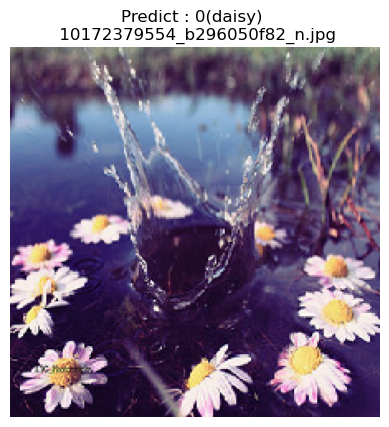

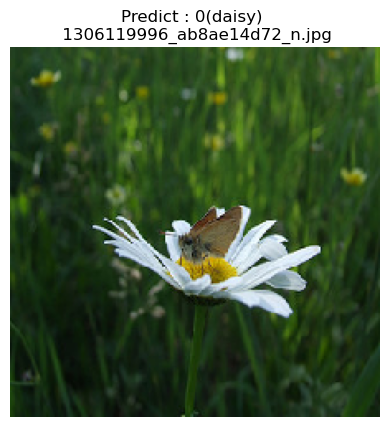

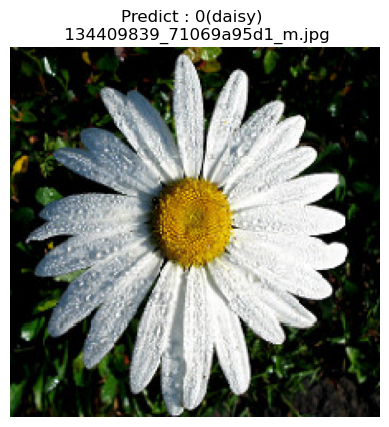

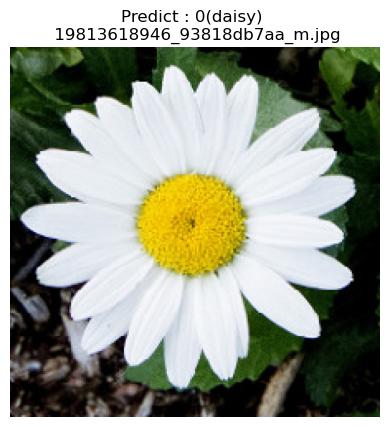

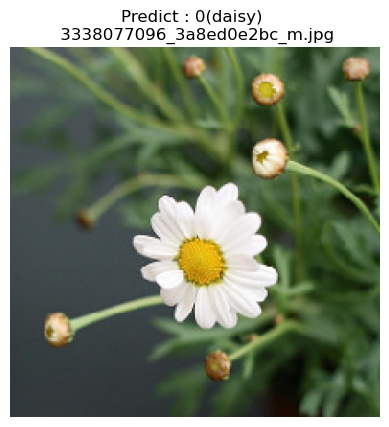

...

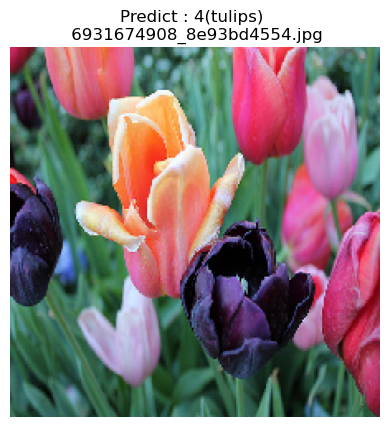

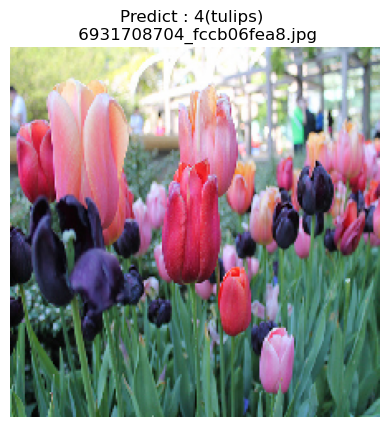

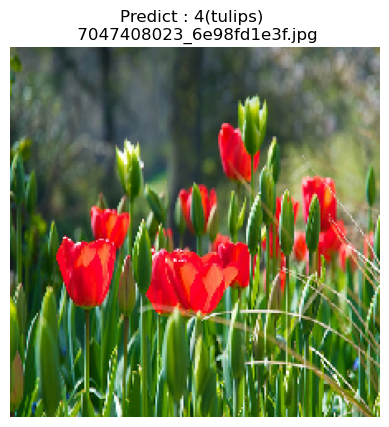

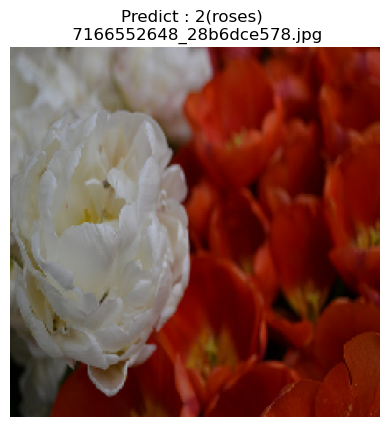

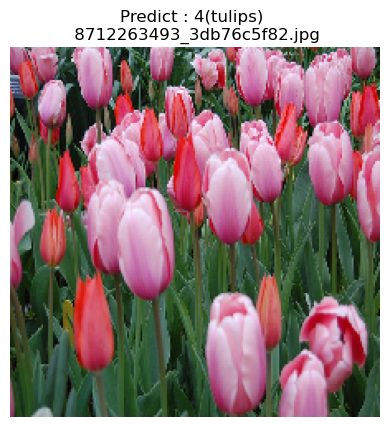

In [ ]:


# 개인 연습
img_g = sorted(glob.glob('./content/flowers/flowers/flower_photos/test/*/*jpg'))
img_f = [ os.path.basename(path)  for path in img_g]
img_l = [ os.path.basename(os.path.dirname(path))  for path in img_g]

imgd = pd.DataFrame()
imgd['image'] = img_g
imgd['file'] = img_f
imgd['label'] = img_l
imgd.head(10)

# 예측값 저장용 변수
img_predictions = []
# img test 데이터셋 폴더 경로
img_folder = './content/flowers/flowers/flower_photos/test/'
# test 데이터셋 라벨 인코딩용 변수
img_label_to_class = {
    0:'daisy',
    1:'dandelion',
    2:'roses',
    3:'sunflowers',
    4:'tulips'
}

#   img_path = row['image']
for img_path in imgd['image']:
  #img_path = os.path.join(img_folder, row['file'])
  img = load_img(img_path, target_size=(224,224))
  img_array = img_to_array(img)
  img_array = np.expand_dims(img_array, axis=0)

  img_pred_t = model.predict(img_array, verbose=0)
  img_pred_label = np.argmax(img_pred_t)
  img_pred_class = img_label_to_class.get(img_pred_label, 'None')
  img_predictions.append(img_pred_label)

  plt.imshow(img)
  plt.title(f'Predict : {img_pred_label}({img_pred_class}) \n {os.path.basename(img_path)}')
  plt.axis('off')
  plt.show()

In [215]:
# img 모델의 예측값을 csv파일에 추가해줍니다.
imgd['pred'] = img_predictions
imgd.head(10)

,image,file,label,pred
0,./content/flowers/flowers/flower_photos/test\d...,10172379554_b296050f82_n.jpg,daisy,0
1,./content/flowers/flowers/flower_photos/test\d...,1306119996_ab8ae14d72_n.jpg,daisy,0
2,./content/flowers/flowers/flower_photos/test\d...,134409839_71069a95d1_m.jpg,daisy,0
3,./content/flowers/flowers/flower_photos/test\d...,19813618946_93818db7aa_m.jpg,daisy,0
4,./content/flowers/flowers/flower_photos/test\d...,3338077096_3a8ed0e2bc_m.jpg,daisy,0
5,./content/flowers/flowers/flower_photos/test\d...,3552074420_2a0a7166db_m.jpg,daisy,0
6,./content/flowers/flowers/flower_photos/test\d...,4141147800_813f660b47.jpg,daisy,0
7,./content/flowers/flowers/flower_photos/test\d...,538920244_59899a78f8_n.jpg,daisy,0
8,./content/flowers/flowers/flower_photos/test\d...,5973488341_50bdf6cee3_n.jpg,daisy,0
9,./content/flowers/flowers/flower_photos/test\d...,8446495985_f72d851482.jpg,daisy,0


In [218]:
# img 예측한 값의 라벨을 수정해줍니다.
imgd['pred'] = imgd['pred'].map(img_label_to_class)
imgd.head(10)

,image,file,label,pred
0,./content/flowers/flowers/flower_photos/test\d...,10172379554_b296050f82_n.jpg,daisy,daisy
1,./content/flowers/flowers/flower_photos/test\d...,1306119996_ab8ae14d72_n.jpg,daisy,daisy
2,./content/flowers/flowers/flower_photos/test\d...,134409839_71069a95d1_m.jpg,daisy,daisy
3,./content/flowers/flowers/flower_photos/test\d...,19813618946_93818db7aa_m.jpg,daisy,daisy
4,./content/flowers/flowers/flower_photos/test\d...,3338077096_3a8ed0e2bc_m.jpg,daisy,daisy
5,./content/flowers/flowers/flower_photos/test\d...,3552074420_2a0a7166db_m.jpg,daisy,daisy
6,./content/flowers/flowers/flower_photos/test\d...,4141147800_813f660b47.jpg,daisy,daisy
7,./content/flowers/flowers/flower_photos/test\d...,538920244_59899a78f8_n.jpg,daisy,daisy
8,./content/flowers/flowers/flower_photos/test\d...,5973488341_50bdf6cee3_n.jpg,daisy,daisy
9,./content/flowers/flowers/flower_photos/test\d...,8446495985_f72d851482.jpg,daisy,daisy


In [219]:
# img 모델의 성능은 0.86이 나왔네요
# 시험에서는 테스트 데이터셋의 라벨이 없기 때문에 불필요한 부분입니다.
img_correct_count = sum(imgd['label']==imgd['pred'])
img_total_count = len(imgd)
img_model_accuracy = img_correct_count/img_total_count
print(f'img_model_accuracy : {img_model_accuracy:.2f}')

img_model_accuracy : 0.86


In [220]:
# img 테스트 데이터셋.csv를 저장합니다.
imgd.to_csv('01012345678_3.csv', index=False, encoding='utf-8')
imgd6 = pd.read_csv('01012345678_3.csv')
imgd6.head(10)

,image,file,label,pred
0,./content/flowers/flowers/flower_photos/test\d...,10172379554_b296050f82_n.jpg,daisy,daisy
1,./content/flowers/flowers/flower_photos/test\d...,1306119996_ab8ae14d72_n.jpg,daisy,daisy
2,./content/flowers/flowers/flower_photos/test\d...,134409839_71069a95d1_m.jpg,daisy,daisy
3,./content/flowers/flowers/flower_photos/test\d...,19813618946_93818db7aa_m.jpg,daisy,daisy
4,./content/flowers/flowers/flower_photos/test\d...,3338077096_3a8ed0e2bc_m.jpg,daisy,daisy
5,./content/flowers/flowers/flower_photos/test\d...,3552074420_2a0a7166db_m.jpg,daisy,daisy
6,./content/flowers/flowers/flower_photos/test\d...,4141147800_813f660b47.jpg,daisy,daisy
7,./content/flowers/flowers/flower_photos/test\d...,538920244_59899a78f8_n.jpg,daisy,daisy
8,./content/flowers/flowers/flower_photos/test\d...,5973488341_50bdf6cee3_n.jpg,daisy,daisy
9,./content/flowers/flowers/flower_photos/test\d...,8446495985_f72d851482.jpg,daisy,daisy


In [221]:
# img 딥러닝 모델을 저장해줍니다.
model.save('01012345678_3.h5')

In [229]:

# img train, valid 경로 지정
train_path = './Face/Train'
valid_path = './Face/Valid'


In [230]:
import pandas as pd
import numpy as pd
import matplotlib.pyplot as plt
import os
import glob

import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.applications import MobileNetV3Large 
from tensorflow.keras.preprocessing import  image_dataset_from_directory
from tensorflow.keras.optimizers import Adam

In [231]:
# img train dataset 만들기
train_dataset = image_dataset_from_directory(
    directory=train_path,     # 데이터가 들어있는 최상위 디렉토리
    labels='inferred',        # 하위 폴더 이름을 클래스 레이블로 자동 추출
    label_mode='categorical', # 라벨을 원-핫 인코딩으로 반환
    color_mode='rgb',         # 컬러 이미지 (3채널)
    batch_size=32,            # 한 번에 32개씩 묶어서 제공 > 데이터셋에서 꺼낼 때 shape이 (32, 224, 224, 3) 형태로 나옵니다.
    image_size=(224,224),     # 모든 이미지를 224x224로 resize
    seed=42,                  # 셔플 시 랜덤 시드 고정 (재현성 보장)
    shuffle=True              # 데이터를 무작위 섞기
)

# img valid dataset 만들기
valid_dataset = image_dataset_from_directory(
    directory=valid_path,
    labels='inferred',
    label_mode='categorical',
    color_mode='rgb',
    batch_size=32,
    image_size=(224,224),
    seed=42,
    shuffle=True
)

Found 54 files belonging to 3 classes.


Found 54 files belonging to 3 classes.


In [232]:
# img 사전학습 모델인 MobileNetV3Large 사용
# 이미지 사이즈는 사전 학습된 모델 호환성 – 많은 딥러닝 모델(VGG16, ResNet 등)이
# 224x224 크기의 이미지를 입력으로 사용하도록 학습되었기 때문에 이렇게 사용했습니다.
img_base_model = MobileNetV3Large(input_shape=(224,224,3), # 입력 이미지 크기 (224x224, RGB 3채널)
                                  weights='imagenet',      # ImageNet 데이터셋으로 학습된 가중치 사용 
                                  include_top=False)       # 마지막 분류기(FC Layer)는 빼고 가져오기 False로 하면 마지막 FC 층을 제거하고, Conv 블록까지만 가져옵니다.

img_base_model.trainable=False                             # MobileNetV3-Large의 모든 가중치를 학습 불가능(동결, Freeze) 상태로 둡니다.
                                                           # 즉, 백본(Feature Extractor)은 고정시키고, 내가 새로 추가한 Dense 층만 학습됩니다.       
                                                           
model = Sequential()
model.add(img_base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(3, activation='softmax'))

#img 딥러닝 모델 compile
model.compile(
    optimizer=Adam(0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


es3 = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
mc3 = ModelCheckpoint('best_img_model.keras', monitor='val_loss', save_best_only=True, verbose=1)

history3 = model.fit(
    train_dataset,
    epochs=10,
    validation_data=valid_dataset,
    callbacks=[es3, mc3],
    verbose=1
)

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.2049 - loss: 1.6422
Epoch 1: val_loss improved from inf to 0.44763, saving model to best_img_model.keras
2/2 ━━━━━━━━━━━━━━━━━━━━ 21s 6s/step - accuracy: 0.2106 - loss: 1.6240 - val_accuracy: 0.9815 - val_loss: 0.4476
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 632ms/step - accuracy: 0.8414 - loss: 0.5085
Epoch 2: val_loss improved from 0.44763 to 0.18391, saving model to best_img_model.keras
2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 3s/step - accuracy: 0.8511 - loss: 0.4994 - val_accuracy: 1.0000 - val_loss: 0.1839
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 568ms/step - accuracy: 0.9659 - loss: 0.2437
Epoch 3: val_loss improved from 0.18391 to 0.08478, saving model to best_img_model.keras
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 3s/step - accuracy: 0.9649 - loss: 0.2447 - val_accuracy: 1.0000 - val_loss: 0.0848
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 583ms/step - accuracy: 0.9225 - loss: 0.1908
Epoch 4: val_loss improved from 0.08478 to 0.03337, saving model

In [ ]:

# 개인 연습
img_g = sorted(glob.glob('./content/flowers/flowers/flower_photos/test/*/*jpg'))
img_f = [ os.path.basename(path)  for path in img_g]
img_l = [ os.path.basename(os.path.dirname(path))  for path in img_g]

imgd = pd.DataFrame()
imgd['image'] = img_g
imgd['file'] = img_f
imgd['label'] = img_l
imgd.head(10)

# 예측값 저장용 변수
img_predictions = []
# img test 데이터셋 폴더 경로
img_folder = './content/flowers/flowers/flower_photos/test/'
# test 데이터셋 라벨 인코딩용 변수
img_label_to_class = {
    0:'daisy',
    1:'dandelion',
    2:'roses',
    3:'sunflowers',
    4:'tulips'
}


#   img_path = row['image']
for img_path in imgd['image']:
  #img_path = os.path.join(img_folder, row['file'])
  img = load_img(img_path, target_size=(224,224))
  img_array = img_to_array(img)
  img_array = np.expand_dims(img_array, axis=0)

  img_pred_t = model.predict(img_array, verbose=0)
  img_pred_label = np.argmax(img_pred_t)
  img_pred_class = img_label_to_class.get(img_pred_label, 'None')
  img_predictions.append(img_pred_label)

  plt.imshow(img)
  plt.title(f'Predict : {img_pred_label}({img_pred_class}) \n {os.path.basename(img_path)}')
  plt.axis('off')
  plt.show()